This whole post can be downloaded as a Jupyter notebook [here](/posts/speeding-up-calculations-with-lookup-tables-and-lagrangian-interpolation.ipynb)

# Lookup Tables with Lagrangian Interpolation

One of my students wanted to speed up the calculation of `exp(x)` in a simulation. There are a few ways to do this, but a lookup table is often a huge win in situations like this. The basic idea is that, for an *expensive* function like `exp(x)`, you pre-calculate `exp(x)` for a bunch of values that cover the range in which you're interested. You then look things up in the table at runtime. If the exact value you want isn't in the table, you use a *cheap* interpolation function. By tweaking the density of your pre-calculated values and the sophistication of your interpolation function, you can get results that are quite close to exact calculations for a fraction of the run-time cost.

Sadly for me, I didn't know a bunch about which interpolation functions to use, so I asked Andy Simmonett. I wrote the Python bits below, but the general explanation is direct from him, with some light modifications. He's a QM/MM guy, so some of what is written below should be taken in the context of molecular simulations.

<!-- TEASER_END -->

Before anything else, let's set up Python and use [Seaborn](http://web.stanford.edu/~mwaskom/software/seaborn/) for good-looking default plotting parameters.

In [1]:
from __future__ import division
import sys, os
import numpy as np, scipy as sp, pandas as pd, matplotlib as mpl
from scipy import stats
import matplotlib.pyplot as plt
import seaborn
seaborn.set()

%install_ext https://raw.githubusercontent.com/rasbt/watermark/master/watermark.py
%load_ext watermark
%watermark -v -m -p numpy,pandas,scipy,matplotlib
%matplotlib inline

Installed watermark.py. To use it, type:
  %load_ext watermark
CPython 2.7.8
IPython 2.3.0

numpy 1.9.1
pandas 0.14.1
scipy 0.14.0
matplotlib 1.4.2

compiler   : GCC 4.4.7 20120313 (Red Hat 4.4.7-1)
system     : Linux
release    : 3.16.2-200.fc20.x86_64
machine    : x86_64
processor  : x86_64
CPU cores  : 8
interpreter: 64bit


## The General strategy

I \[Andy\] don’t know of any decent source about lookup tables, but here are some notes that demonstrate how we figured out the splines.  The simplest approach to understand is Lagrangian Interpolation [wiki](http://en.wikipedia.org/wiki/Lagrange_polynomial) [wolfram](http://mathworld.wolfram.com/LagrangeInterpolatingPolynomial.html), which is the approach that we used because it’s so general.  The strategy is as follows:-

 1. Choose a range of inputs values (∆E/kT in your case) that you expect to encounter frequently (say, 0 to 3).  I’ve defined the function below such that an input of the positive argument ∆E/kT returns Exp[-∆E/kT].

 2. Choose a spacing value (referred to below as del) between successive grid points; this will determine both the storage needed for the table and also the accuracy of the interpolation, so some experimentation is necessary.  The example below uses del=0.1, but generally you need at least a hundred grid points per unit to get single precision accuracy, and even more for double precision.

 3. You need to allocate (range/del+1) grid points to hold the table of values.  For a quartic interpolation (see below) you need two extra points, to handle the end points (-0.1 and 3.1 in the example above, so you can interpolate the full range).

 4.  Now you need to construct your table:  Tab = {Exp[0.1], Exp[0], Exp[-0.1], Exp[-0.2], …, Exp[-3.1]}

 5. For a given input, x, if it’s outside the range of your interpolation table, just explicitly compute and return Exp[-x].

 6.  If it’s inside the range, use an interpolating polynomial (below) to interpolate the values.


In [2]:
from numpy import exp,sqrt,sin
def gettable(start,stop,d,f):
    return f(np.arange(start-2*d,stop+2*d,d)) # enough for quintic

Wikipedia has some good info on Lagrangian interpolation (see links above).  I’ve [Andy] pasted the explicit code needed for cubic, quartic, and quintic splines; these were obtained using the corresponding Mathematica inputs.  Most codes use cubic splines for efficiency, but we found that quartic splines let you use a coarser table, so they may be more cache effiecient.

 * cubic

        Simplify[InterpolatingPolynomial[{{x0 - del, e0}, {x0, e1}, {x0 + del, e2}}, x]]

        (2 del^2 e1 - del (e0 - e2) (x - x0) + (e0 - 2 e1 + e2) (x - x0)^2)/(2 del^2)
 * quartic
 
        Simplify[InterpolatingPolynomial[{{x0 - del, e0}, {x0, e1}, {x0 + del, e2}, {x0 + 2 del, e3}}, x]]

        -((-6 del^3 e1 + del^2 (2 e0 + 3 e1 - 6 e2 + e3) (x - x0) - 3 del (e0 - 2 e1 + e2) (x - x0)^2 + (e0 - 3 e1 + 3 e2 - e3) (x - x0)^3)/(6 del^3))

 * quintic
 
        Simplify[InterpolatingPolynomial[{{x0 - 2 del, e0}, {x0 - del, e1}, {x0, e2}, {x0 + del, e3}, {x0 + 2 del, e4}}, x]]

        (1/(24 del^4))(24 del^4 e2 + 2 del^3 (e0 - 8 e1 + 8 e3 - e4) (x - x0) - 
         del^2 (e0 - 16 e1 + 30 e2 - 16 e3 + e4) (x - x0)^2 - 
         2 del (e0 - 2 e1 + 2 e3 - e4) (x - x0)^3 + (e0 - 4 e1 + 6 e2 - 4 e3 + 
         e4) (x - x0)^4)

Assume we’re using a quartic polynomial, and want to compute Exp[-0.22].  We need to pick out the 4 consecutive table entries {e0,e1,e2,e3} whose x values bound 0.22, so that we’re interpolating, not extrapolating.  This is shown below (# represents the value we’re interested in).

      e0    e1     e2     e3
      |      | #    |      |
      ----------------------
    x0-del   x0  x0+del x0+2del
     0.1    0.2    0.3    0.4

The values {e0,e1,e2,e3} are {Exp[-0.1],Exp[-0.2],Exp[-0.3],Exp[-0.4]}, taken straight from the table.  The we just plug in (x-x0 = 0.22-0.2 = 0.02) into the quartic formula above, along with the tablulated e* values, and out comes the answer.

For an odd-order interpolating spline, make sure the value you're probing is in the middle of the range of table values, although it doesn’t matter which side of the center point if falls on; make sure the corresponding sign is correct when computing x-x0 though.

This is using Lagrangian interpolation. [PME](http://en.wikipedia.org/wiki/Ewald_summation#Particle_mesh_Ewald_.28PME.29_method) uses and Euler interpolating spline instead, so that might be worth investigating.  I’ve attached the [paper](http://scitation.aip.org/content/aip/journal/jcp/103/19/10.1063/1.470117) in case you’re interested.  Note that the method above works for absolutely any function; you just have to tabulate the compute values ahead of time, which is cheap.  To test the table, you can simply probe all of the midpoints (0.05, 0.15, 0.25, … in the example above) and compare the interpolated and analytic function.  If it’s something that’s commonly run in single precision anyway, you should be able to get away with errors around 10^-7 or 10^-8.  We get 10^-13, in our code, which is close enough to the machine epsilon for our liking.

**Note** I also stuck in linear interpolation for comparison.

In [3]:
def cubic(x,f,table,start,stop,d):
    try:
        #i0 will be the table index of the largest element lower than x.
        i0 = int((x - start)//d) + 2 # because we have two extra entries
        x0 = start + d*(i0 -2)
        e0, e1, e2 = table[i0-1:i0+2]
        #print("{i0} {x0} {e0} {e1} {e2} {e3}".format(**locals()))
        return (2*e1*d**2 - d*(e0 - e2)*(x - x0) + (e0 - 2*e1 + e2)*(x - x0)**2)/(2*d**2)
    # You'd think IndexError, but it comes from grabbing N table entries.
    # If the start or stop value is too high, you just won't be able to extract
    # The full three (in this case) entries from the table error, so the
    # e0, e1, e2 = ... line will raise a ValueError
    except ValueError: 
        return f(x)
def quartic(x,f,table,start,stop,d):
    try:
        i0 = int((x - start)//d) + 2
        x0 = start + d*(i0 -2)
        e0, e1, e2, e3 = table[i0-1:i0+3]
        return -((-6*e1*d**3 + d**2 * (2*e0 + 3*e1 - 6*e2 + e3)*(x - x0) 
                  - 3*d*(e0 - 2*e1 + e2)*(x - x0)**2 
                  + (e0 - 3*e1 + 3*e2 - e3)*(x - x0)**3)/(6*d**3))
    except ValueError:
        return f(x)
def quintic(x,f,table,start,stop,d):
    try:
        i0 = int((x - start)//d) + 2
        x0 = start + d*(i0 -2)
        e0, e1, e2, e3, e4 = table[i0-2:i0+3]
        return (1/(24*d**4))*( 24*d**4*e2 + 2*d**3*(e0 - 8*e1 + 8*e3 - e4)*(x - x0) - 
                d**2*(e0 - 16*e1 + 30*e2 - 16*e3 + e4)*(x - x0)**2 - 
                2*d*(e0 - 2*e1 + 2*e3 - e4)*(x - x0)**3 + 
                (e0 - 4*e1 + 6*e2 - 4*e3 + e4)*(x - x0)**4 )
    except ValueError:
        return f(x)
# and why not
def linear(x,f,table,start,stop,d):
    try:
        i0 = int((x - start)//d) + 2
        x0 = start + d*(i0 -2)
        e0, e1,  = table[i0:i0+2]
        #m = (e1-e0)/d
        #b = e0 - m*x0
        #return m*x + b
        return e0 + (x-x0)*(e1-e0)/d
    except ValueError:
        return f(x)
    

def getinterp(order):
    return {2:linear,3:cubic,4:quartic,5:quintic}[order]
def getinterpname(order):
    return {2:'linear',3:'cubic',4:'quartic',5:'quintic'}[order]

So let's test, giving each one values inside the range as well as on both sides

In [4]:
start,stop,d = 0,3,0.1
def f(x):
    return exp(-x)
table = gettable(start,stop,d,f)
def printapprox(order,val,f):
    interp = getinterp(order)
    exact,interpd = f(val),interp(val,f,table,start,stop,d)
    pdiff = abs(100 - 100*interpd/exact)
    print("exact {a} approx {b} %diff {c}".format(a=exact,b=interpd,c=pdiff))
def getf(name):
    def fexp(x):
        return exp(-x)
    def fsqr(x):
        return sqrt(x)
    def fsin(x):
        return sin(4*x)
    return {'exp':fexp,'sqrt':sqrt,'sin':fsin}[name]

print("Linear")
printapprox(2,.22,f)
printapprox(2,-.22,f)
printapprox(2,5.22,f)
print("Cubic")
printapprox(3,.22,f)
printapprox(3,-.22,f)
printapprox(3,5.22,f)
print("Quartic")
printapprox(4,.22,f)
printapprox(4,-.22,f)
printapprox(4,5.22,f)
print("Quintic")
printapprox(5,.22,f)
printapprox(5,-.22,f)
printapprox(5,5.22,f)

Linear
exact 0.802518797962 approx 0.803148246599 %diff 0.0784341298732
exact 1.24607673059 approx 1.24607673059 %diff 0.0
exact 0.00540732912644 approx 0.00540732912644 %diff 0.0
Cubic
exact 0.802518797962 approx 0.802492715994 %diff 0.00325001342684
exact 1.24607673059 approx 1.24607673059 %diff 0.0
exact 0.00540732912644 approx 0.00540732912644 %diff 0.0
Quartic
exact 0.802518797962 approx 0.802517668788 %diff 0.000140703834049
exact 1.24607673059 approx 1.24607673059 %diff 0.0
exact 0.00540732912644 approx 0.00540732912644 %diff 0.0
Quintic
exact 0.802518797962 approx 0.802518849726 %diff 6.45019096623e-06
exact 1.24607673059 approx 1.24607673059 %diff 0.0
exact 0.00540732912644 approx 0.00540732912644 %diff 0.0


That looks good. It's worth noting that this algorithm gives bad results in at least one clear case: for `sqrt`, the interpolations that try to use values for `x < 0` will all give `nan`. One easy fix would be to test for a `nan` return value and just return the exact value. You'd have to consider how close your actual values are likely to be to zero, though, as that test will have to run for every lookup. There are probably smarter fixes. Here's a demonstration:

In [5]:
table = gettable(start=0,stop=3,d=0.1,f=getf('sqrt'))
cubic(x=0.01,f=getf('sqrt'),table=table,start=0,stop=3,d=0.1)

nan

Now let's look at this visually.

**Note** that I cap the lower axis at 150%. When you're calculating numbers very close to zero (see `sin` for clear examples), the percentage error can get huge, and you might want to use other techniques (Taylor expansion, etc.).

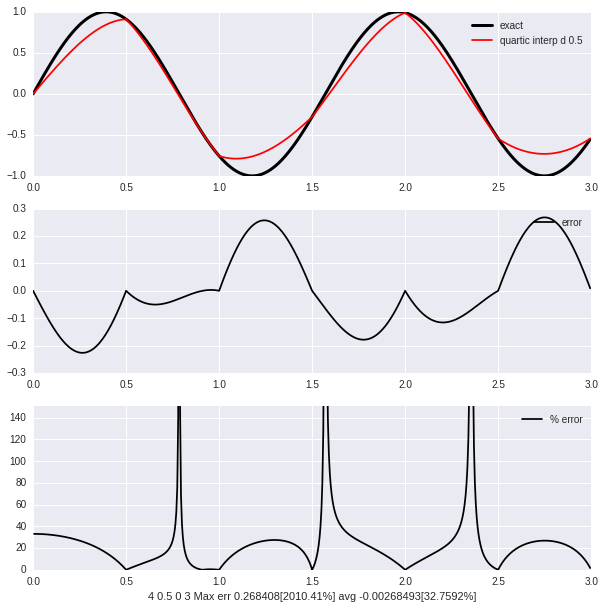

In [12]:
from IPython.html import widgets 
from IPython.html.widgets import interact

figsize=(10,10)
def showinterp(d,order,fname='exp',rangeexp=0):
    fig = plt.figure(figsize=figsize)
    f = getf(fname)
    start,stop = 0,3
    start,stop,d = start*10**rangeexp,stop*10**rangeexp,d*10**rangeexp
    x = np.arange(start,stop,d/100.0)
    table = gettable(start,stop,d,f)
    exact = f(x)
    # Make these ufuncs for some huge speedup
    interp = getinterp(order)
    interpd = np.array([interp(i,f,table,start,stop,d) for i in x])
    #print(interpd[:10])
    err = interpd - exact
    errfrac = err/exact
    xerrfrac = x[~np.isnan(errfrac)] # for plotting later
    errfrac = errfrac[~np.isnan(errfrac)]
    errfrac = np.abs(errfrac)
    perr = np.abs(100*errfrac)
    plt.subplot(3,1,1)
    plt.plot(x,exact,'k',label='exact',lw=3)
    plt.plot(x,interpd,'r-',label='{n} interp d {d}'.format(n=getinterpname(order),d=d))
    plt.legend(fancybox=True)
    plt.subplot(3,1,2)
    plt.plot(x,err,'k-',label='error')
    plt.legend(fancybox=True)
    plt.subplot(3,1,3)
    plt.plot(xerrfrac,perr,'k-',label='% error')
    if plt.ylim()[1] > 151:
        plt.ylim(plt.ylim()[0],151)
    plt.legend(fancybox=True)
    #plt.grid(True)
    m = np.max(err[~np.isnan(err)])
    a = np.average(err[~np.isnan(err)])
    mp = np.max(perr)
    ap = np.average(perr)
    plt.xlabel('{order} {d} {start} {stop} Max err {m:g}[{mp:g}%] avg {a:g}[{ap:g}%]'.format(**locals()))
    return fig
interact(showinterp,d=widgets.FloatSliderWidget(min=.001,max=.5,step=.001,value=.1),
         order=(2,5),
         fname=['exp','sqrt','sin'],
         rangeexp=widgets.IntSliderWidget(min=-20,max=0,step=20,value=0)
         )

That's awesome in a live notebook. Let's do something similar that we can look at statically. There are two main choices here: [JSAnimation](https://github.com/jakevdp/JSAnimation) and [IPy-Widgets](https://github.com/jakevdp/ipywidgets), both by the indomitable [Jake VanderPlas](http://www.astro.washington.edu/users/vanderplas/). I really like the ability to play things as a movie, but ipywidgets wins for now because I can do dropdowns. You can animate it by draggin the sliders. Hey, it's like a flipbook! Rangeexp will let you play with the range, so you can see what happens when you look over small divisions between floating point numbers.

In [13]:
from ipywidgets import StaticInteract, RangeWidget, RadioWidget, DropDownWidget
figsize=(6,6)

StaticInteract(showinterp,d=RadioWidget([0.001, 0.0025, 0.005, 0.0075, 0.01, 0.025, 0.05, 0.075, 0.1, 0.25, 0.5],default=0.1),
               order=RangeWidget(2,5,1,default=3),
               fname=DropDownWidget(['exp','sqrt','sin'],default='exp'),
               rangeexp=RadioWidget([-20,0],default=0),
               )

/home/mglerner/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [8]:
%%html
    <div id="disqus_thread"></div>
    <script type="text/javascript">
        /* * * CONFIGURATION VARIABLES: EDIT BEFORE PASTING INTO YOUR WEBPAGE * * */
        var disqus_shortname = 'mathematicalphysics'; // required: replace example with your forum shortname

        /* * * DON'T EDIT BELOW THIS LINE * * */
        (function() {
            var dsq = document.createElement('script'); dsq.type = 'text/javascript'; dsq.async = true;
            dsq.src = '//' + disqus_shortname + '.disqus.com/embed.js';
            (document.getElementsByTagName('head')[0] || document.getElementsByTagName('body')[0]).appendChild(dsq);
        })();
    </script>
    <noscript>Please enable JavaScript to view the <a href="http://disqus.com/?ref_noscript">comments powered by Disqus.</a></noscript>